In [222]:
import sys, os
sys.path.insert(0, os.path.abspath('..'))
from scripts.project_functions import *
import pandas as pd
import numpy as np
import pandas_profiling
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import scripts.project_functions

## Method Chaining and Wranging/Cleaning Data

In [223]:
def load_and_process(url):
    #Method Chain 1 to load in data, drop columns that aren't needed, dop any NAN values, and reset the index
    df = (
    pd.read_csv(url)
    .drop(columns=['league_id', 'adj_score1', 'adj_score2'])
    .dropna()
    .reset_index(drop=True)
)
    return df

In [224]:
df = load_and_process("https://projects.fivethirtyeight.com/soccer-api/club/spi_matches_latest.csv")
df.head()


,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,proj_score1,proj_score2,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,1.75,0.84,45.9,22.1,1.0,0.0,1.39,0.26,2.05,0.54
1,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,1.22,1.89,25.6,63.4,0.0,4.0,0.57,2.76,0.80,1.50
2,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,2.58,0.62,77.1,28.8,3.0,0.0,0.49,0.45,1.05,0.75
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,1.10,1.79,35.8,58.9,0.0,1.0,1.12,0.97,1.51,0.94
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,1.57,1.24,26.2,21.3,2.0,2.0,2.77,3.17,1.05,2.08


# Exploratory Data Analysis

## Deeper Analysis into the Variables

In [225]:
df.describe(include=np.number)

,season,spi1,spi2,prob1,prob2,probtie,proj_score1,proj_score2,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2
count,2257.000000,2257.000000,2257.000000,2257.000000,2257.000000,2257.000000,2257.000000,2257.000000,2257.000000,2257.000000,2257.000000,2257.00000,2257.000000,2257.000000,2257.000000,2257.000000
mean,2019.678777,48.086340,47.906238,0.442820,0.308537,0.248641,1.507652,1.196172,32.217457,31.671732,1.511298,1.26451,1.479499,1.216198,1.364125,1.164005
std,0.467050,15.206986,15.319486,0.146468,0.134196,0.044065,0.380821,0.375796,24.213180,23.890336,1.251588,1.18147,0.817096,0.772676,0.617833,0.600391
min,2019.000000,15.460000,15.030000,0.051700,0.011300,0.000000,0.430000,0.210000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.030000,0.010000
25%,2019.000000,38.080000,37.830000,0.350100,0.226500,0.232900,1.260000,0.960000,16.600000,16.400000,1.000000,0.00000,0.860000,0.660000,0.910000,0.750000
50%,2020.000000,44.570000,44.250000,0.436700,0.292800,0.257600,1.450000,1.150000,27.700000,26.900000,1.000000,1.00000,1.360000,1.060000,1.280000,1.050000
75%,2020.000000,58.000000,57.790000,0.520300,0.381700,0.275600,1.700000,1.400000,42.800000,41.900000,2.000000,2.00000,1.980000,1.620000,1.710000,1.480000
max,2020.000000,94.660000,95.320000,0.924100,0.828000,0.325800,3.460000,3.110000,100.000000,100.000000,8.000000,13.00000,6.190000,8.270000,4.340000,7.170000


### Observations:
- Taking a look at the first table, there aren't any big outliers that jump out as being 'incorrect' data 
- A couple of columns do have some interesting data in them such as:
    - The max probability of one team winning (prob1 = 0.924, prob2 = 0.828) is much higher than the max probabilty of their being a tie (probtie = 0.325) 
    - The max importance for either team is set at 100 meaning there are some games which are a must win for teams, and the min importance is at 0 meaning some games do not matter at all for some teams
    - The max score recorded is 13 which is a very rare occurence in a soccer match
    - The difference between the mean for proj_score1 and score1 is 0.003397 , and the difference for proj_score2 and score 2 is 0.067412, meaning that as a whole the predictive model looks as though it is doing a good job of predicting the score


In [226]:
df.describe(include=np.object)

,date,league,team1,team2
count,2257,2257,2257,2257
unique,306,19,353,353
top,2020-10-03,Major League Soccer,Jiangsu Suning FC,Shanghai SIPG
freq,62,303,15,15


### Observations:
- Not much of note here other than that the top league with the most rows is Major League Soccer, expected it to be the Premier League from my knowledge

In [227]:
df.profile_report()

### Observations
- Good to see that there are no missing cells and we still have over 2249 rows of observations with 20 columns
- No duplicate rows meaning we have lots of unique data
- Interesting to see there are 1524 2020 season variables compared to 725 2019 season variables
- A lot of the variables have a high cardinality meaning there columns with values are very unique
- Both proj_score1 and proj_score2 are highly correlated with prob1 and prob2 respectively, which makes sense because the higher than projected score for a team the greater chance they have to win, and lower score = lower chance


## Relationships Between Variables

### Correlation Matrix

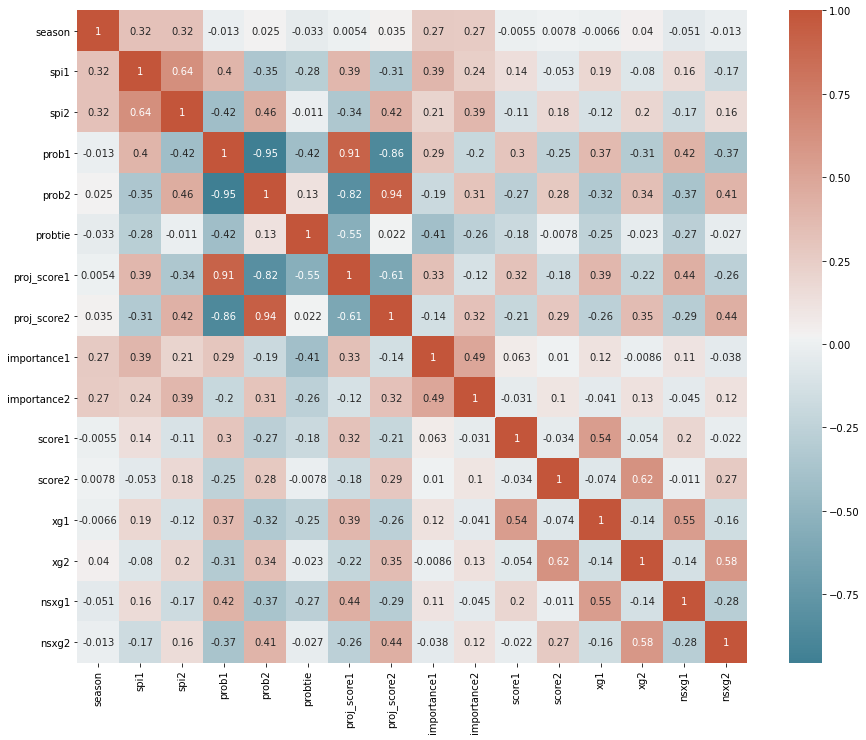

In [228]:
#HeatMap taken from the guide at https://towardsdatascience.com/an-extensive-guide-to-exploratory-data-analysis-ddd99a03199e
corr = df.corr()# plot the heatmap
plt.subplots(figsize=(15,12))
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True))
plt.show()

#### Observations on Correlation Matrix
- spi1/2 
    - has positive correlation with their respective prob1/2 and a negative correlation with the opposite prob1/2. This makes sense as the higher the spi ranking for a team the higher the probability for that team should be and the lower the spi ranking for a team the higher the opposing teams probability should be.
    - has a positive correlation with their respective proj_score1/2 and a negative correlation with the opposite proj_score/2. Again, this makes sense as the higher/lowr the spi ranking for a team the higher/lower projected scores should be for that team and the opposing team. (note this exists for score1/2 as well)
    - has a positive correlation with their respective xg1/2, nsxg1/2 (shot-based expected goals and non-shot expected goals) and a negative correlation with the opposite xg1/2,nsxg1/2. This is interesting to see because it is basically telling us the higher the spi ranking for a team the more goals they should score based on shots and non-shooting actions around the goal, and vice versa with less shots and less actions should amount to less goals for them
- prob1/2 
    - as discussed before, has a positive/negative correlation with proj_score1/2 respectively as well as score1/2
- probtie
    - has a negative correlation with basically every column. Makes sense because the probability of a tie occuring means that both teams play the same thus one team has no advantage over the other
- importance1/2
    - has a positive correlation with their respective prob1/2 and negative correlation with the opposite prob1/2. Basically saying that the more important that the game is to a team the higher the probabilty they have and less important the game the lower probability they have. This is the same correlation for score1/2 as well. Also, interesting to note it has a negative correlation with probtie, meaning that if a game is important to a team the less likely they will play for the tie
    - has a positive correlation with each other. Meaning that the more important a game is to one team, it is likely that the game is important for the other team as well. 
- score1/2
    - has a positive correlation with their respective xg1/2, nsxg1/2. This makes sense as the higher the score1/2 is for a team the more shots they should of taken around the opposing teams goal (xg1/2) respectively, and the greater number of non-shooting actions they should have taken around the opposing teams goal (nsxg1/2)


### PairPlot

#### Constructing a pairplot using some of the variables that had correlation from the correlation matrix to observe other relationships

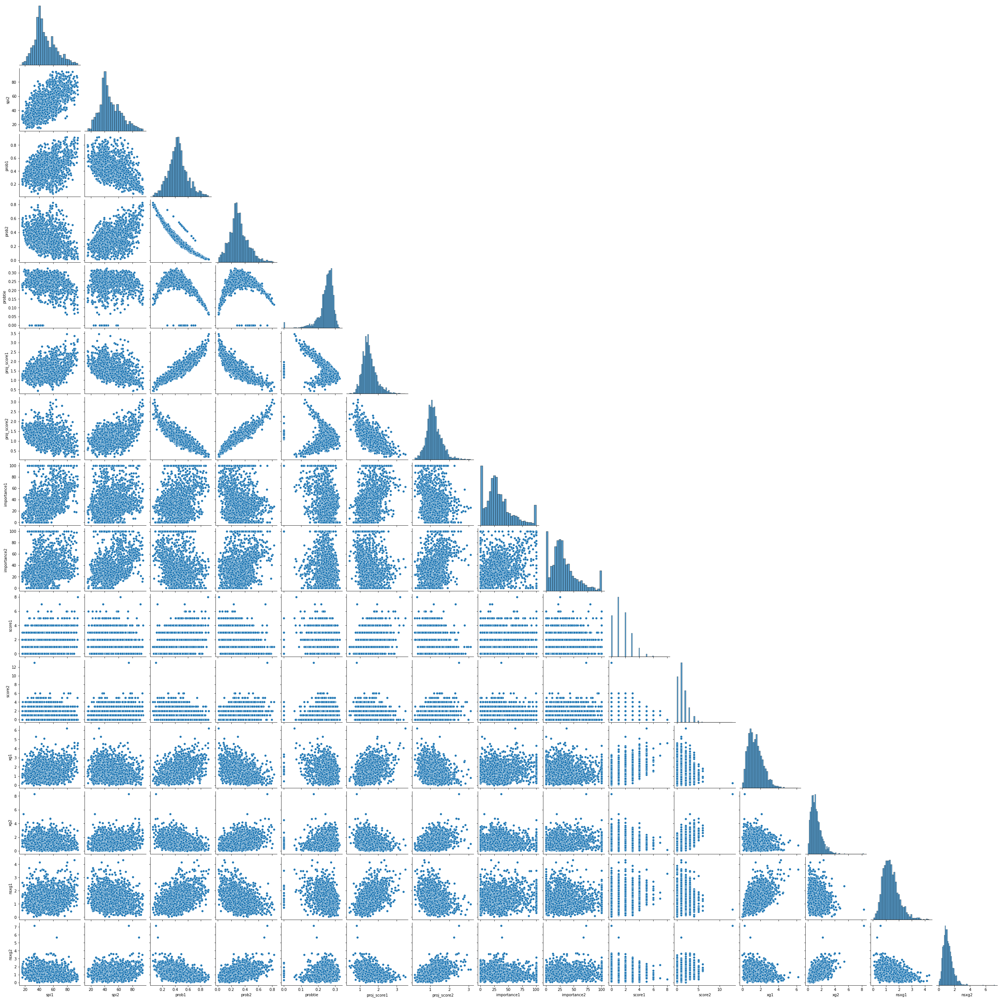

In [229]:
sns.pairplot(df, x_vars=['spi1','spi2','prob1','prob2','probtie','proj_score1','proj_score2','importance1','importance2','score1','score2','xg1','xg2','nsxg1','nsxg2'],y_vars=['spi1','spi2','prob1','prob2','probtie','proj_score1','proj_score2','importance1','importance2','score1','score2','xg1','xg2','nsxg1','nsxg2'],corner=True)
plt.show()

#### Observations on PairPlot
- Most of this just recommunicated what was said in the correlation matrix but is beneficial to see how the actual numbers look like in each of the scatterplots shown

### Boxplot and Strip Plot

#### Creating a Boxplot and Strip Plot to see score totals (sum of score 1 and score 2) in each league - this will be used later to compute the average score of each league

In [230]:
#This should be put in a method chain afterwards but for now we cannot so leave it like this
dfScore = (
    df
    .assign(TotalScore=lambda x: (x.score1) + (x.score2))
)
dfScore.head()

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,...,proj_score2,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2,TotalScore
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,...,0.84,45.9,22.1,1.0,0.0,1.39,0.26,2.05,0.54,1.0
1,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,...,1.89,25.6,63.4,0.0,4.0,0.57,2.76,0.80,1.50,4.0
2,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,...,0.62,77.1,28.8,3.0,0.0,0.49,0.45,1.05,0.75,3.0
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,...,1.79,35.8,58.9,0.0,1.0,1.12,0.97,1.51,0.94,1.0
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,...,1.24,26.2,21.3,2.0,2.0,2.77,3.17,1.05,2.08,4.0


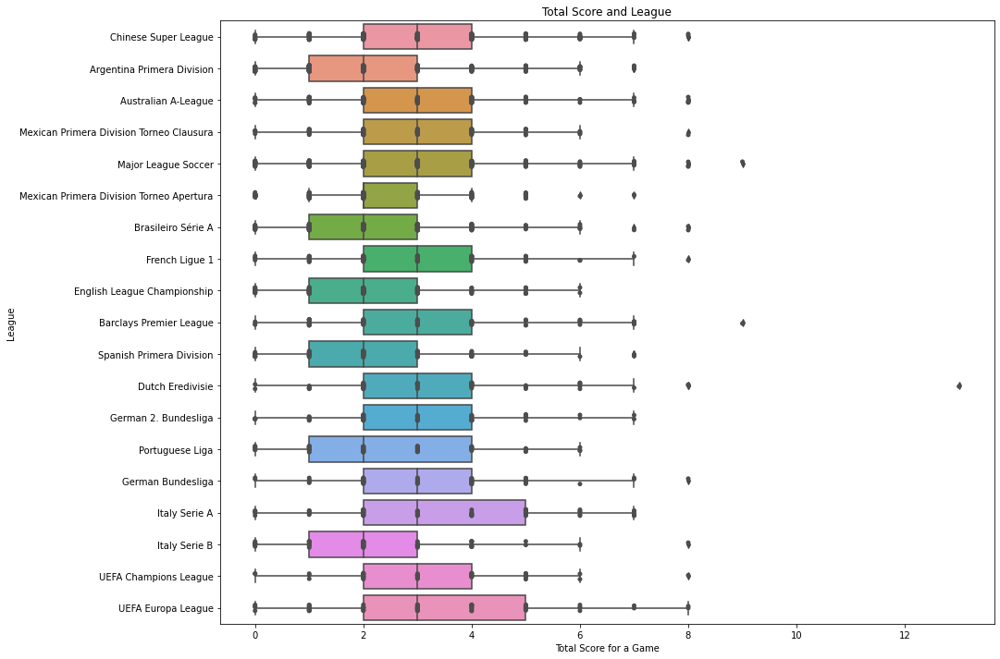

In [231]:
plt.subplots(figsize=(15,12))
boxp = sns.boxplot(y=dfScore['league'],x=dfScore['TotalScore'])
stripp = sns.stripplot(y=dfScore['league'],x=dfScore['TotalScore'],color='.3')
plt.xlabel('Total Score for a Game')
plt.ylabel('League')
plt.title('Total Score and League')

plt.show()

#### Observations on Boxplot and Strip Plot
- Without looking into the average Total Score for a league we cannot officially say which league is the most scoring league, but for now looking at the histogram:
    - One big outlier is in the Dutch Eredivisie with a score of 13 goals for one game
    - Most of the data is concentrated around 1-4 total goals
    - Very little amounts of high total scores
    

### Hexbin Plot

#### Creating a Hexbin Plot to observe the values between importance1 and importance2 as they are correlated and to see where most of the points lie around

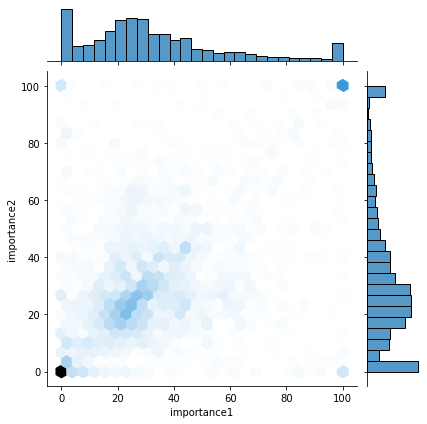

In [232]:
hexb =sns.jointplot(x=df['importance1'],y=df['importance2'],kind="hex")
plt.show()

#### Observations on Boxplot and Strip Plot
- This is very interesting to see. Most of the importance values lie at 0 meaning a lot of the games in this dataset do not matter for both teams. This however does make sense, as a lot of the time the standings are finalized late in the season and thus the teams do not care if they win or lose. There are however a good amount of values at 100 meaning there are a lot of games that are do or die for teams. The rest are spread around 20-40 mostly. 

# Conduct Analysis on Research Questions

### Research Questions
1. Which of the two columns, probabilities and importance, are better at predicting the actual outcome of the game?
2. How accurate are the projected score parameters, as well as xg and nsxg at predicting the actual score?
3. (Smaller Question) Which league is the highest scoring league?


### Plan of Attack for Research Questions
1. Create a new column "predictedWinner" with the projected winner based on the parameters
2. Do the same thing but create a column "actualWinner" with the actual winner determined by the scores given
3. Use some data visualizations to determine how well each parameter does in predicting
4. Do basically the same thing for the scores and compare the predictions to the actual scores
5. For determing which league is highest scoring need to compute the average score of each league and use some visualizations.

### Research Question 1: Which of the two columns, probabilities and importance, are better at predicting the actual outcome of the game?

#### Creating Column for predicted winner based on each probabilities:
<p> Note: we put team 1 if team 1 is projected to win, and team 2 if team 2 is projected to win. As ties do not have a high probability projected, we will say any time the probability for a tie is greater than 0.3 we will classify that as a predicted tie game. <p>

In [233]:
def prediction(df):
    if (df['probtie']>= 0.3):
        val = 'tie'
    elif (df['prob1'] > df['prob2']) & (df['prob1'] > df['probtie']):
        val = 'team1'
    elif (df['prob2'] > df['prob1']) & (df['prob2'] > df['probtie']):
        val = 'team2'
    return val



In [234]:
df['probPredWinner'] = df.apply(prediction, axis=1)

In [235]:
df

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,...,proj_score2,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2,probPredWinner
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,...,0.84,45.9,22.1,1.0,0.0,1.39,0.26,2.05,0.54,team1
1,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,...,1.89,25.6,63.4,0.0,4.0,0.57,2.76,0.80,1.50,team2
2,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,...,0.62,77.1,28.8,3.0,0.0,0.49,0.45,1.05,0.75,team1
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,...,1.79,35.8,58.9,0.0,1.0,1.12,0.97,1.51,0.94,team2
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,...,1.24,26.2,21.3,2.0,2.0,2.77,3.17,1.05,2.08,team1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,2020,2020-11-14,Brasileiro Série A,Fortaleza,São Paulo,48.45,62.57,0.2686,0.4441,0.2872,...,1.24,26.9,68.5,2.0,3.0,1.26,1.14,1.24,0.74,team2
2253,2020,2020-11-14,Brasileiro Série A,Grêmio,Ceará,63.57,48.46,0.6105,0.1577,0.2318,...,0.74,27.2,28.1,4.0,2.0,2.13,0.67,1.38,1.38,team1
2254,2020,2020-11-14,Brasileiro Série A,Corinthians,Atletico Mineiro,49.28,60.65,0.3108,0.4356,0.2536,...,1.47,24.6,59.9,1.0,2.0,1.26,2.42,0.85,1.56,team2
2255,2020,2020-11-14,Brasileiro Série A,Palmeiras,Fluminense,60.88,51.46,0.5642,0.1870,0.2487,...,0.79,20.9,5.8,2.0,0.0,1.23,0.49,0.82,0.88,team1


#### Creating Column for actual winner of the game
<p> Comparing the scores of the game, tie will be classified if both scores are the same

In [236]:
def actual(df):
    if (df['score1'] == df['score2']):
        val = 'tie'
    elif (df['score1'] > df['score2']):
        val = 'team1'
    elif (df['score2'] > df['score1']):
        val = 'team2'
    return val

In [237]:
df['actualWinner'] = df.apply(actual, axis=1)

In [238]:
df

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,...,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2,probPredWinner,actualWinner
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,...,45.9,22.1,1.0,0.0,1.39,0.26,2.05,0.54,team1,team1
1,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,...,25.6,63.4,0.0,4.0,0.57,2.76,0.80,1.50,team2,team2
2,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,...,77.1,28.8,3.0,0.0,0.49,0.45,1.05,0.75,team1,team1
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,...,35.8,58.9,0.0,1.0,1.12,0.97,1.51,0.94,team2,team2
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,...,26.2,21.3,2.0,2.0,2.77,3.17,1.05,2.08,team1,tie
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,2020,2020-11-14,Brasileiro Série A,Fortaleza,São Paulo,48.45,62.57,0.2686,0.4441,0.2872,...,26.9,68.5,2.0,3.0,1.26,1.14,1.24,0.74,team2,team2
2253,2020,2020-11-14,Brasileiro Série A,Grêmio,Ceará,63.57,48.46,0.6105,0.1577,0.2318,...,27.2,28.1,4.0,2.0,2.13,0.67,1.38,1.38,team1,team1
2254,2020,2020-11-14,Brasileiro Série A,Corinthians,Atletico Mineiro,49.28,60.65,0.3108,0.4356,0.2536,...,24.6,59.9,1.0,2.0,1.26,2.42,0.85,1.56,team2,team2
2255,2020,2020-11-14,Brasileiro Série A,Palmeiras,Fluminense,60.88,51.46,0.5642,0.1870,0.2487,...,20.9,5.8,2.0,0.0,1.23,0.49,0.82,0.88,team1,team1


#### Creating Column for predicted winner based on importance:
<p> Comparing the importance value and if one team has a higher importance than the other they will be projected to win. If the same then a tie. <p>

In [239]:
def impPrediction(df):
    if (df['importance1'] == df['importance2']):
        val = 'tie'
    elif (df['importance1'] > df['importance2']):
        val = 'team1'
    elif (df['importance2'] > df['importance1']):
        val = 'team2'
    return val

In [240]:
df['predImpWinner'] = df.apply(impPrediction, axis=1)

<p> Now that we have the dataframe with the predictions based on the probabilities as well as the importance columns, we can use some visualizations to take a look at how accurate they are <p>

#### Data Visualizations

**Constructing a scatterplot to first observe the relationship between the variables**

**Prob1 vs Score 1 and Prob2 vs Score2**

<AxesSubplot:xlabel='score1', ylabel='prob1'>

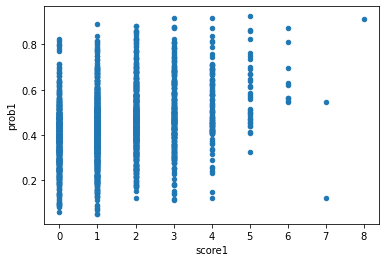

In [241]:
df.plot(kind='scatter', x='score1', y='prob1')

<AxesSubplot:xlabel='score2', ylabel='prob2'>

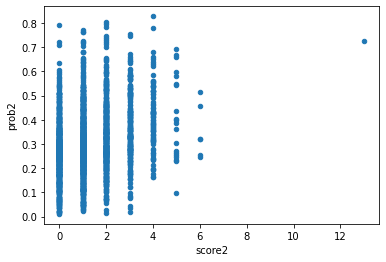

In [242]:
df.plot(kind='scatter', x='score2', y='prob2')

As expected, as the probability for a team increases so does their goals scored for the game.

**Importance1 vs Score 1 and Importance2 vs Score2**

<AxesSubplot:xlabel='score1', ylabel='importance1'>

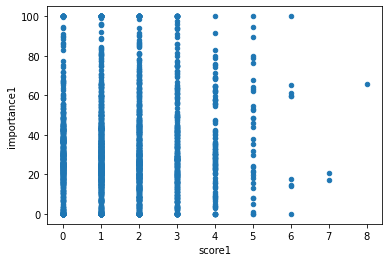

In [243]:
df.plot(kind='scatter', x='score1', y='importance1')

<AxesSubplot:xlabel='score2', ylabel='importance2'>

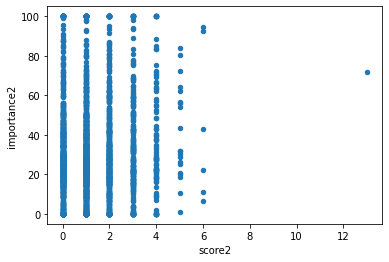

In [244]:
df.plot(kind='scatter', x='score2', y='importance2')

These two plots convey the same as the probability plots in the sense that importance1 and importance2, have a direct correlation with score1 and score2. 

**Constructing a countplot to visualize the predictions for both prediction parameters**

Text(0, 0.5, 'Probability Prediction Prediction')

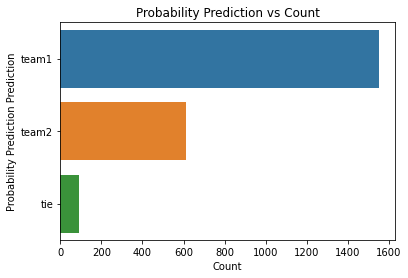

In [245]:
table = sns.countplot(y="probPredWinner", data=df)
table.set_title("Probability Prediction vs Count")
plt.xlabel("Count")
plt.ylabel("Probability Prediction Prediction")

Text(0, 0.5, 'Importance Prediction')

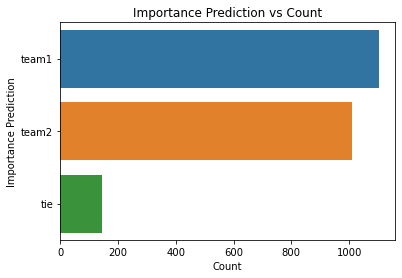

In [246]:
table1 = sns.countplot(y="predImpWinner", data=df)
table1.set_title("Importance Prediction vs Count")
plt.xlabel("Count")
plt.ylabel("Importance Prediction")

Very interesting to see that team1 has a much higher predicted count of winning the match when taking into considerations the probalities as compared to when taking into account the importance. Vice versa for team 2 where the predicted is much higher for the importance parameter. 

Now comparing to the actual winners:

Text(0, 0.5, 'Actual Winner')

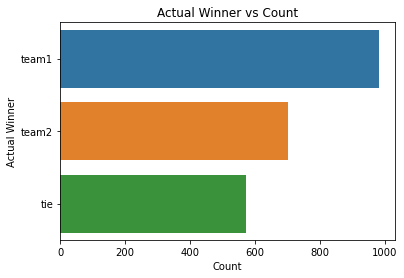

In [247]:
table2 = sns.countplot(y="actualWinner", data=df)
table2.set_title("Actual Winner vs Count")
plt.xlabel("Count")
plt.ylabel("Actual Winner")

As can be seen there is a big jump in the amount of ties as compared to what was predicted. This could be due to the tie parameter we had set when constructing the data, but rarely in any sport is a tie ever predicted as it is hard to do so. This could be something to look to in the future. 

**Now create a new column for each prediction parameter and if the prediction was correct we will assign it values accordingly (0 - prediction imcorrect, 1 - prediction correct)**

In [248]:
def correctPred(df):
    if (df['probPredWinner'] == df['actualWinner']):
        val = 1
    else:
        val = 0
    return val

In [249]:
def correctImp(df):
    if (df['predImpWinner'] == df['actualWinner']):
        val = 1
    else:
        val = 0
    return val

In [250]:
df['probPred'] = df.apply(correctPred, axis=1)

In [251]:
df['impPred'] = df.apply(correctImp, axis=1)

In [252]:
df.head()

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,...,score2,xg1,xg2,nsxg1,nsxg2,probPredWinner,actualWinner,predImpWinner,probPred,impPred
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,...,0.0,1.39,0.26,2.05,0.54,team1,team1,team1,1,1
1,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,...,4.0,0.57,2.76,0.80,1.50,team2,team2,team2,1,1
2,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,...,0.0,0.49,0.45,1.05,0.75,team1,team1,team1,1,1
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,...,1.0,1.12,0.97,1.51,0.94,team2,team2,team2,1,1
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,...,2.0,2.77,3.17,1.05,2.08,team1,tie,team1,0,0


**Now create a countplot for each parameter**

Text(0, 0.5, 'Probability Result')

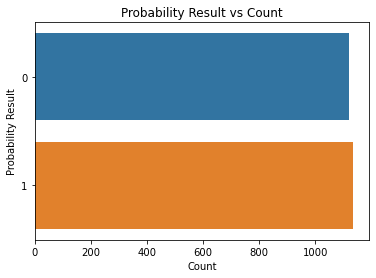

In [253]:
table3 = sns.countplot(y="probPred", data=df)
table3.set_title("Probability Result vs Count")
plt.xlabel("Count")
plt.ylabel("Probability Result")

Text(0, 0.5, 'Importance Result')

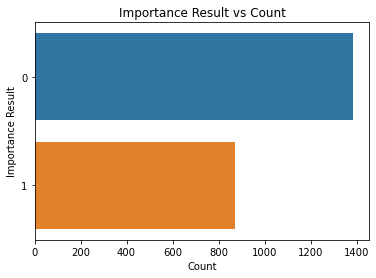

In [254]:
table4 = sns.countplot(y="impPred", data=df)
table4.set_title("Importance Result vs Count")
plt.xlabel("Count")
plt.ylabel("Importance Result")

Interesting to see that the probability parameter has a much higher rate of succession just looking at the countplots, but neither seem to be very good from the plots.

**Tables to illustrate Data**

<p> Table 1 <p>

| | Probability | Importance | Actual |
| --- | --- | --- | --- |
| Ties | 4.1%        | 6.3%       | 25.3%  |
| Team 1 | 68.8%       | 48.9%      | 43.5% |
| Team 2 | 27.1%       | 44.7%      | 31.1% |

<p> Table 2 - to show the number of times the correct result of the game was predicted <p>

| | # of Correct | # of Incorrect | % Correct |
| --- | --- | --- | --- |
| Probability | 1136        | 1121       | 50.3%  |
| Importance | 871       | 1386      | 38.6% |


#### Summary and Conclusion

- First, by observing the scatterplots of both the probabilities vs actual scores and importance vs actual scores, we can see a direct correlation between the two. As the probability/importance start to increase so does the score for that team. Secondly, we can tale a look at the count plots for what the probability and importance parameter predicted vs the actual result count plot. Directly, we notice that the ties have a drastic difference between the predicted countplots and the actual countplots, which make sense as predicting a tie is the hardest thing to do in sports. In addition, the team1/team2 prediction for the probabilites differed greatly from the team1/team2 prediction for the importance. Taking a look at Table 1 we can directly see these results. Lastly, we compare the results of the predictions. We can see from the countplots that probability does a much better job at predicting the correct result in comparison to the importance parameter. Table 2 shows this results in detail as the probability paramater as has 50.3% correct rate and the importance parameter has a 38.6% correct rate. In conclusion, to answer our research question, the probability parameter does a much better job at predicting the correct result in comparison to the importance parameter; however, it is worth noting that neither is a very good indicator of the actual result as in our case the probability parameter was only correct 50% of the time. In future work it would be interesting to see the results of the probability plots if the tie parameter was moved around and trying to figure out at which value does this work best in the predictions. 

### Research Question 2: How accurate are the projected score parameters, as well as xg and nsxg at predicting the actual score?

<p> Note: A prediction is classified as correct if it is +- 0.5 from the actual score. For example, if the prediction for team 1 was 1.5 and team 1 scored 1, the prediction would be correct.

#### Constructing hexbin for each of the parameters:

**proj_score1 vs score1, proj_score2 vs score2, xg1 vs score1, xg2 vs score2, nsxg1 vs score1, nsxg2 vs score1**

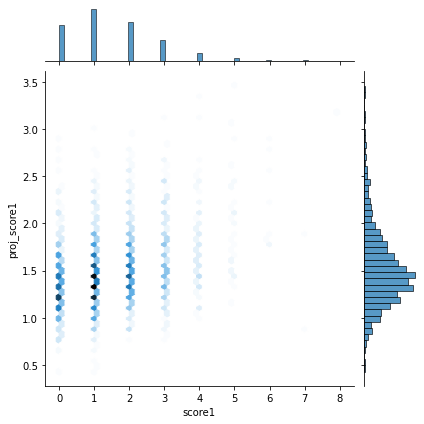

In [255]:
hexb =sns.jointplot(x=df['score1'],y=df['proj_score1'],kind="hex")
plt.show()

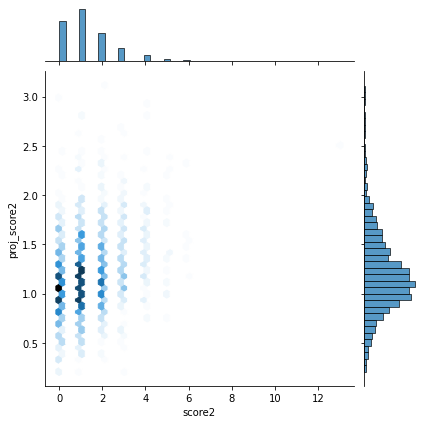

In [256]:
hexb1 =sns.jointplot(x=df['score2'],y=df['proj_score2'],kind="hex")
plt.show()

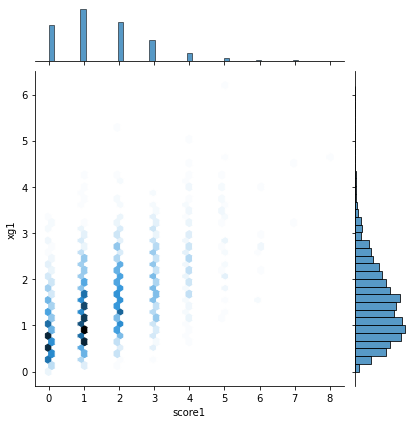

In [257]:
hexb2 =sns.jointplot(x=df['score1'],y=df['xg1'],kind="hex")
plt.show()

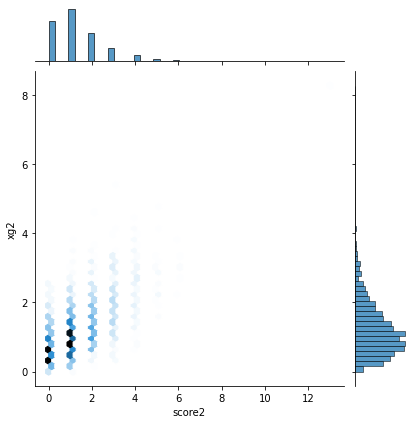

In [258]:
hexb3 =sns.jointplot(x=df['score2'],y=df['xg2'],kind="hex")
plt.show()

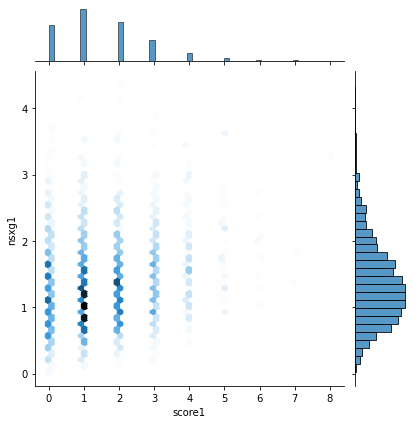

In [259]:
hexb4 =sns.jointplot(x=df['score1'],y=df['nsxg1'],kind="hex")
plt.show()

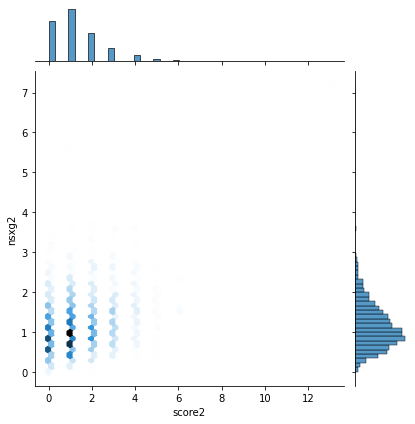

In [260]:
hexb5 =sns.jointplot(x=df['score2'],y=df['nsxg2'],kind="hex")
plt.show()

<p> As can be seen in the hexbin plots all the parameters are heavily correlated and the majority fall around the same spot on the plot in between 0-2 goals. <p>

#### Creating Column if the prediction falls under the threshold (0 - prediction imcorrect, 1 - prediction correct)

In [261]:
def proj_1Pred(df):
    if (abs(df['proj_score1'] - df['score1']) <= 0.5):
        val = 1
    else:
        val = 0
    return val
def proj_2Pred(df):
    if (abs(df['proj_score2'] - df['score2']) <= 0.5):
        val = 1
    else:
        val = 0
    return val
def xg1(df):
    if (abs(df['xg1'] - df['score1']) <= 0.5):
        val = 1
    else:
        val = 0
    return val
def xg2(df):
    if (abs(df['xg2'] - df['score2']) <= 0.5):
        val = 1
    else:
        val = 0
    return val
def nsxg1(df):
    if (abs(df['nsxg1'] - df['score1']) <= 0.5):
        val = 1
    else:
        val = 0
    return val
def nsxg2(df):
    if (abs(df['nsxg2'] - df['score2']) <= 0.5):
        val = 1
    else:
        val = 0
    return val

In [262]:
df['proj1Result'] = df.apply(proj_1Pred, axis=1)
df['proj2Result'] = df.apply(proj_2Pred, axis=1)
df['xg1Result'] = df.apply(xg1, axis=1)
df['xg2Result'] = df.apply(xg2, axis=1)
df['nsxg1Result'] = df.apply(nsxg1, axis=1)
df['nsxg2Result'] = df.apply(nsxg2, axis=1)

**Countplots to plot the data**

Text(0, 0.5, 'Projected Team 1 Score')

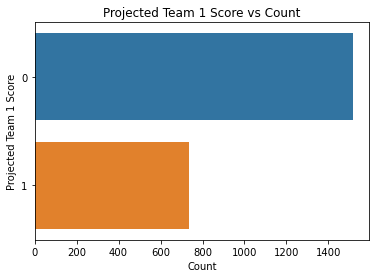

In [263]:
tab1 = sns.countplot(y="proj1Result", data=df)
tab1.set_title("Projected Team 1 Score vs Count")
plt.xlabel("Count")
plt.ylabel("Projected Team 1 Score")

Text(0, 0.5, 'Projected Team 2 Score')

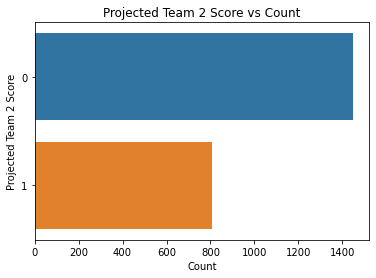

In [264]:
tab2 = sns.countplot(y="proj2Result", data=df)
tab2.set_title("Projected Team 2 Score vs Count")
plt.xlabel("Count")
plt.ylabel("Projected Team 2 Score")

Text(0, 0.5, 'Projected Team 1 Score')

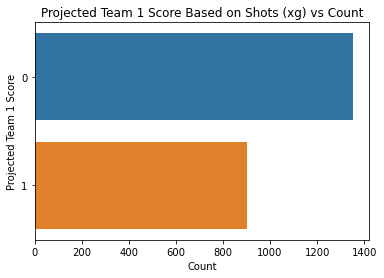

In [265]:
tab3 = sns.countplot(y="xg1Result", data=df)
tab3.set_title("Projected Team 1 Score Based on Shots (xg) vs Count")
plt.xlabel("Count")
plt.ylabel("Projected Team 1 Score")

Text(0, 0.5, 'Projected Team 2 Score')

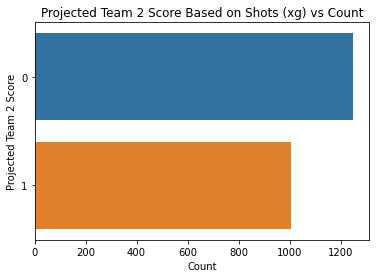

In [266]:
tab4 = sns.countplot(y="xg2Result", data=df)
tab4.set_title("Projected Team 2 Score Based on Shots (xg) vs Count")
plt.xlabel("Count")
plt.ylabel("Projected Team 2 Score")

Text(0, 0.5, 'Projected Team 1 Score')

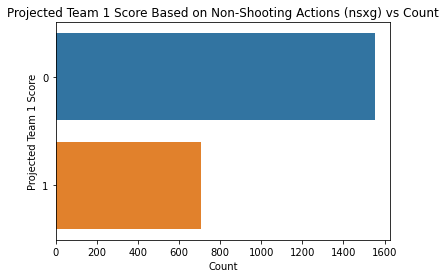

In [267]:
tab5 = sns.countplot(y="nsxg1Result", data=df)
tab5.set_title("Projected Team 1 Score Based on Non-Shooting Actions (nsxg) vs Count")
plt.xlabel("Count")
plt.ylabel("Projected Team 1 Score")

Text(0, 0.5, 'Projected Team 2 Score')

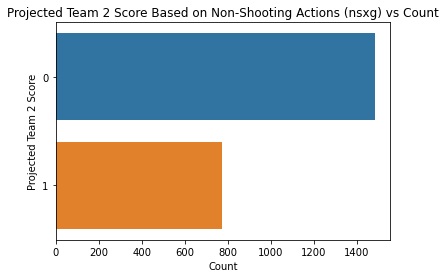

In [268]:
tab6 = sns.countplot(y="nsxg2Result", data=df)
tab6.set_title("Projected Team 2 Score Based on Non-Shooting Actions (nsxg) vs Count")
plt.xlabel("Count")
plt.ylabel("Projected Team 2 Score")

**Tables to illustrate Data**

<p> Table 3 - to show the number of times the correct score was predicted <p>

| | # of Correct | # of Incorrect | % of Correct |
| --- | --- | --- | --- |
| proj_score1 | 738        | 1354       | 32.7%  |
| proj_score2 | 807       | 1450      | 35.8% |
| xg1 | 903       | 1354     | 40.0% |
| xg2 | 1007       | 1250      | 44.6% |
| nsxg1 | 706       | 1551      | 31.3% |
| nsxg2 | 775       | 1482      | 34.3% |

#### Summary and Conclusion

- First, we observe the hexbin plots we made. By looking at the two projected scores plots (proj_score1, proj_score2), we can see there is a much more distributed plot as it looks as though projected scores are taking on more values. However, all of them seem to hover around 0-2 goals for the majority of the dataset. Next, by taking the threshold of +- 0.5 we can construct a new column to observe how good the predictions are. From this we construct our count plots to observe the single result variables as a whole. The countplots show the outlook of the data and we can get a easier to read view from our Table 3. The count plots show us that xg1/2 (shots) seem as though they have the best prediction of the actual scores with proj_score1/2 and nsxg1/2 (non-shot actions) close together. Table 3 gives us the percentage view of this and we can see it is clear that the shots metric (xg1/2) has the most correct predictions out of the bunch. To conclude, based on the data visualizations provided, the shots parameter (xg1/2) is the best at predicting the actual score. It is worth noting however that some of the data used to  formulate the shots (xg) and non-shooting action (nsxg) data was collected after the game and thus the estimation has some sort of data from the game in it, where as the projections for the scores (proj_score1/2) are based off of previous data and the SPI ranking, thus being harder to predict. Overall, none of the parameters seem to be very good as the highest percentage lies at 44.6%, but then again predicting the right score for a game is very hard and even having a 30-40% chance of being correct is still beneficial. 